# EDA - 1] Bike details Dataset

In [33]:
# Import essential liabraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
from wordcloud import WordCloud, STOPWORDS

In [3]:
#Importing the data from given csv file
dataset = pd.read_csv("BIKE DETAILS.csv")
#dataset.head()
dataset_info = dataset.info()
#print(dataset_info)
dset_dtypes = dataset.dtypes
#print("\ndatatypes of columns in dataset\n\n",dset_dtypes)
# Removing Duplicates from dataset
dset = dataset.drop_duplicates()

#creating a copy of dataset
dset_copy = dset.copy()
#print(dset_copy.info())
#check for unique values in the dataset
uniq_name = dset_copy["name"].unique()
#print(uniq_name)
uniq_sell_price = dset_copy["selling_price"].unique()
#uniq_sell_price = dset_copy["selling_price"].value_counts()
#print(uniq_sell_price)
uniq_year = dset_copy["year"].unique()
#print(uniq_year)
uniq_seller = dset_copy["seller_type"].unique()
#print(uniq_seller)
uniq_owner = dset_copy["owner"].unique()
#print(uniq_owner)
dset_copy["seller_type"].value_counts()

#dataset[dataset.duplicated(keep=False)]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1061 entries, 0 to 1060
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1061 non-null   object 
 1   selling_price      1061 non-null   int64  
 2   year               1061 non-null   int64  
 3   seller_type        1061 non-null   object 
 4   owner              1061 non-null   object 
 5   km_driven          1061 non-null   int64  
 6   ex_showroom_price  626 non-null    float64
dtypes: float64(1), int64(3), object(3)
memory usage: 58.1+ KB


seller_type
Individual    1049
Dealer           6
Name: count, dtype: int64

Range of selling price is 755000

Median of selling price is 45000.0
Most common seller type is Individual

The number of bikes driven more than 50,000 kilometers is 168

Average km_driven for each onwership type is 
 owner
1st owner     32732.710240
2nd owner     39288.991870
3rd owner     33292.181818
4th owner    311500.000000
Name: km_driven, dtype: float64

The proportion of bikes of and before 2015 is 56.58767772511848 percent


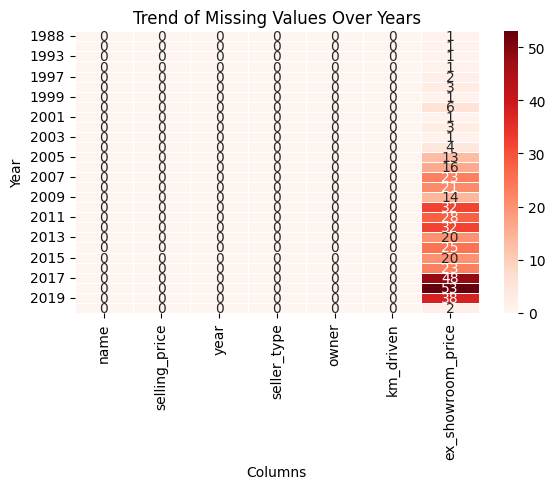

Maximum Ex-showroom price is 1278000.0
The bike with maximum ex-showroom price is Harley-Davidson Street Bob

total number of bikes listed by each seller type seller_type
Individual    1049
Dealer           6
Name: count, dtype: int64


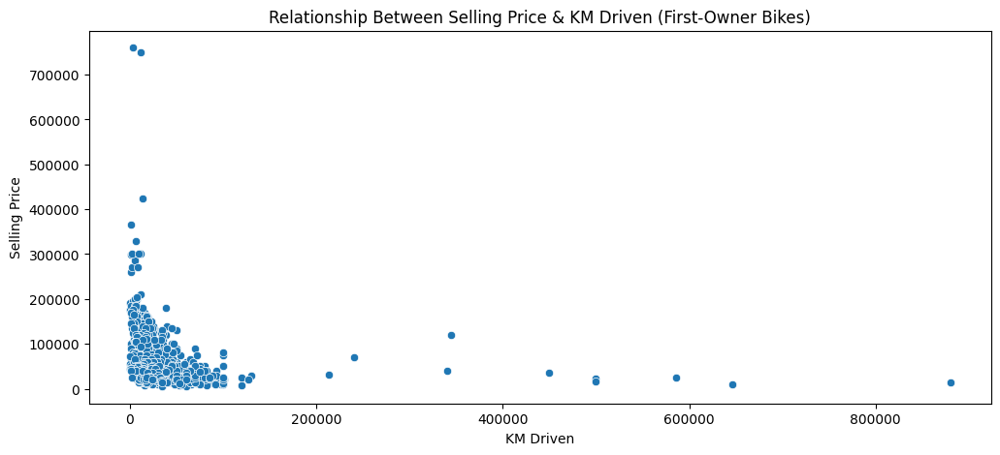

<class 'pandas.core.frame.DataFrame'>
Index: 1055 entries, 0 to 1060
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1055 non-null   object 
 1   selling_price      1055 non-null   int64  
 2   year               1055 non-null   int64  
 3   seller_type        1055 non-null   object 
 4   owner              1055 non-null   object 
 5   km_driven          1055 non-null   int64  
 6   ex_showroom_price  622 non-null    float64
dtypes: float64(1), int64(3), object(3)
memory usage: 98.2+ KB

Dataframe info before filtering
 None
<class 'pandas.core.frame.DataFrame'>
Index: 1017 entries, 0 to 1059
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1017 non-null   object 
 1   selling_price      1017 non-null   int64  
 2   year               1017 non-null   int64  
 3   seller_type        

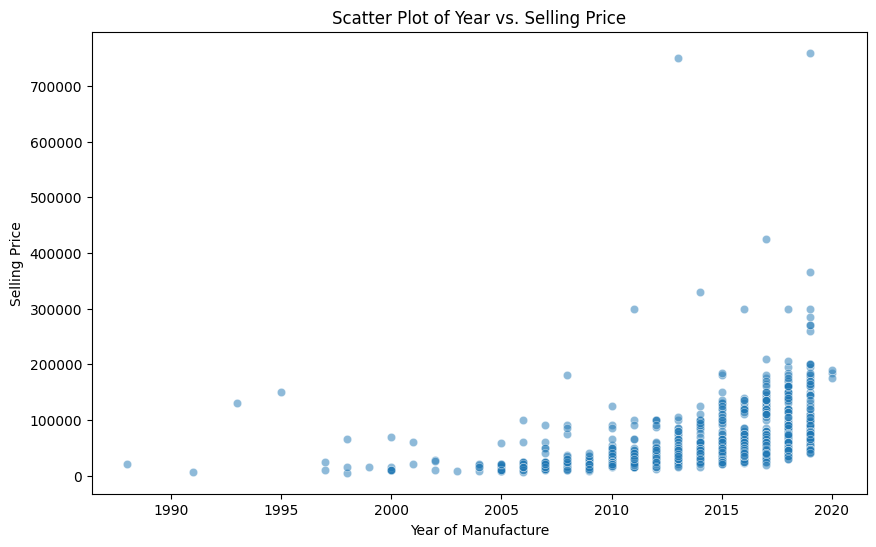

From the plot it cna be concluded that as the number of years is increasing, we can see significant growth in selling price of bikes

Average depreciation is 0               NaN
1               NaN
2       -269.428571
3       2464.300000
4               NaN
           ...     
1056    2333.333333
1057    2692.307692
1058    3500.000000
1059    2875.000000
1060    3823.529412
Length: 1055, dtype: float64

Bikes priced above the average price for their manufacturing year are
 2       Royal Enfield Classic Gunmetal Grey
3         Yamaha Fazer FI V 2.0 [2016-2018]
12                 Bajaj Avenger Street 220
13                            Yamaha YZF R3
17                         Yamaha YZF R15 S
                       ...                 
1020               Bajaj Avenger Street 220
1022                    Bajaj Pulsar NS 200
1023                 Bajaj Avenger 220 dtsi
1036                          Honda Karizma
1039                          Honda Karizma
Name: name, Length: 145, dtype: objec

In [4]:
'''Q.1] What is the range of selling prices in the dataset'''
selling_price_range = dset_copy["selling_price"].max() - dset_copy["selling_price"].min()
print("Range of selling price is",selling_price_range)

'''Q.2] What is the median selling price for bikes in the dataset'''
selling_price_median = dset_copy["selling_price"].median()
print("\nMedian of selling price is",selling_price_median)

'''Q.3] What is the most common seller type'''
common_seller = dset_copy["seller_type"].mode()
print("Most common seller type is",dset_copy["seller_type"].mode()[0])

'''Q.4] How many bikes have driven more than 50,000 kilometers'''
no_of_bikes = (dset_copy["km_driven"]>50000).sum()
print("\nThe number of bikes driven more than 50,000 kilometers is",no_of_bikes)

'''Q.5]  What is the average km_driven value for each ownership type'''
avg_km_driven = dset_copy.groupby("owner")["km_driven"].mean()
print("\nAverage km_driven for each onwership type is \n",avg_km_driven)

'''Q.6] What proportion of bikes are from the year 2015 or older'''
bike_2015 = (dset_copy["year"]<=2015).sum()
total_bikes = dset_copy.shape[0]
proportion_of_bike = (float)(bike_2015/total_bikes)
print("\nThe proportion of bikes of and before 2015 is",proportion_of_bike*100,"percent")

'''Q.7] What is the trend of missing values across the dataset?'''
missing_trend = dset_copy.isnull().groupby(dset_copy['year']).sum()
# Plot the trend of missing values over the years
plt.figure(figsize=(6,5))
sns.heatmap(missing_trend, annot=True, cmap='Reds', linewidths=0.5)
plt.title("Trend of Missing Values Over Years")
plt.xlabel("Columns")
plt.ylabel("Year")
plt.tight_layout()
plt.show()

'''Q.8] What is the highest ex_showroom_price recorded, and for which bike?'''
print("Maximum Ex-showroom price is",dset_copy["ex_showroom_price"].max())
print("The bike with maximum ex-showroom price is", dset_copy.loc[dset_copy["ex_showroom_price"].idxmax(), 'name'])

'''Q.9] What is the total number of bikes listed by each seller type?'''
sum_of_bikes_seller = dset_copy["seller_type"].value_counts()
print("\ntotal number of bikes listed by each seller type",sum_of_bikes_seller)

'''Q.10] What is the relationship between selling_price and km_driven for first-owner bikes?'''

first_owner_bikes = dset_copy[dset_copy['owner'] == 'First Owner']

plt.figure(figsize=(12,5))
sns.scatterplot(data=first_owner_bikes, x=dset_copy['km_driven'], y=dset_copy['selling_price'])
plt.title("Relationship Between Selling Price & KM Driven (First-Owner Bikes)")
plt.xlabel("KM Driven")
plt.ylabel("Selling Price")
plt.show()

'''Q.11]  Identify and remove outliers in the km_driven column using the IQR method'''
km_driven_data = dset_copy["km_driven"]
upper = np.percentile(km_driven_data, 75)
lowr = np.percentile(km_driven_data, 25)
#print("Q3 = ",upper,", Q1 = ",lowr)

iqr = upper-lowr
upper_whisker = upper+1.5*iqr
lowr_whisker = lowr-1.5*iqr
#print("IQR is ",iqr,"Upper whisker is",upper_whisker,", lower whisker is",lowr_whisker)
print("\nDataframe info before filtering\n",dset_copy.info())
filtered_dset = dset_copy[(dset_copy["km_driven"]<=upper_whisker) & (dset_copy["km_driven"]>=lowr_whisker)]
print("\nDataframe info after filtering\n",filtered_dset.info())

'''Q.12]  Perform a bivariate analysis to visualize the relationship between year and selling_price'''
plt.figure(figsize=(10, 6))
sns.scatterplot(data=dset_copy, x="year", y="selling_price", alpha=0.5)
plt.xlabel("Year of Manufacture")
plt.ylabel("Selling Price")
plt.title("Scatter Plot of Year vs. Selling Price")
plt.show()
print("From the plot it cna be concluded that as the number of years is increasing, we can see significant growth in selling price of bikes")

'''Q.13] What is the average depreciation in selling price based on the bike's age (current year - manufacturing year)'''
from datetime import datetime

dset_copy["bike_age"] = datetime.now().year - dset_copy["year"]
avg_depreciation = (dset_copy["ex_showroom_price"] - dset_copy["selling_price"])/dset_copy["bike_age"]
print("\nAverage depreciation is",avg_depreciation)

'''Q.14] Which bike names are priced significantly above the average price for their manufacturing year?'''
print("\nBikes priced above the average price for their manufacturing year are\n",dset_copy.loc[(dset_copy["ex_showroom_price"]>dset_copy["ex_showroom_price"].mean()), 'name'])

'''Q.15] Develop a correlation matrix for numeric columns and visualize it using a heatmap'''
corr_matrix = dset_copy.select_dtypes(include=[np.number]).corr()
print(corr_matrix)

# EDA - 2] Car Sale Dataset

In [5]:
car_data = pd.read_csv("Car Sale.csv")

unique_date = car_data["Date"].unique()

#change datatype of date column to datetime
car_data["Date"] = pd.to_datetime(car_data["Date"], errors="coerce")
print("\n\n",car_data["Date"].info())

uniq_Engine = car_data["Engine"].unique()
print("\n",uniq_Engine)
#car_data["Engine"].info()

#list of
cat_cols = [col for col in car_data.columns if car_data[col].dtype == "object"]
#cat_cols
num_cols = [col for col in car_data.columns if car_data[col].dtype != "object"]
#num_cols
car_data.rename(columns = {"Dealer_No ":"Dealer_No"}, inplace=True)
car_data["Dealer_No"] = car_data["Dealer_No"].str.replace("-", "", regex=True)
print(car_data["Dealer_No"].unique())
car_data["Dealer_No"] = pd.to_numeric(car_data["Dealer_No"])
#print(car_data.info())

car_data["Car_id"] = pd.to_numeric(car_data["Car_id"].str.replace("C_CND_", "", regex=True))
#car_data.info()
car_data["Customer Name"] = car_data["Customer Name"].astype("string")
#car_data.info()
obj_type_str = ["Gender", "Dealer_Name", "Company", "Transmission", "Color", "Body Style", "Dealer_Region"]
car_data[obj_type_str] = car_data[obj_type_str].astype("string")
#car_data.info()
car_data["Dealer_Region"].unique
cat_columns = ['Gender', 'Dealer_Name', 'Company', 'Transmission', 'Color', 'Dealer_No', 'Body Style', 'Dealer_Region']
car_data[cat_columns] = car_data[cat_columns].astype("category")
#car_data.info()
print(car_data.isnull().sum())
print(car_data["Car_id"].head())

car_data = car_data.rename(columns = {"Price ($)" : "Price"})
car_data.info()

'''Q.1] What is the average selling price of cars for each dealer, and how does it compare across different dealers'''
avg_sell_price = car_data.groupby("Dealer_Name")["Price"].mean()
print("\n",avg_sell_price)

'''Q.2] Which car brand (Company) has the highest variation in prices, and what does this tell us about the pricing trends?'''
price_range = car_data.groupby("Company")["Price"].apply(lambda x : x.max() - x.min()).sort_values(ascending=False)
print("\nCompany with highest Price variation is :",price_range.idxmax(),", and the variation is",price_range.max())
print("The average variation in price for all the companies is",price_range.mean()," and median variation is ",price_range.median(),". So from this we can say that the company offers wide variety of options to choose from")

'''Q.3]  What is the distribution of car prices for each transmission type, and how do the interquartile ranges compare?'''
px.box(data_frame=car_data, x='Transmission', y='Price', title="Distribution of car prices for each transmission type", height=500)

<class 'pandas.core.series.Series'>
RangeIndex: 23906 entries, 0 to 23905
Series name: Date
Non-Null Count  Dtype         
--------------  -----         
23906 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 186.9 KB


 None

 ['DoubleÂ\xa0Overhead Camshaft' 'Overhead Camshaft']
['064573834' '605047114' '387018047' '993013882' '535469427' '852573102'
 '787587841']
Car_id           0
Date             0
Customer Name    1
Gender           0
Annual Income    0
Dealer_Name      0
Company          0
Model            0
Engine           0
Transmission     0
Color            0
Price ($)        0
Dealer_No        0
Body Style       0
Phone            0
Dealer_Region    0
dtype: int64
0    1
1    2
2    3
3    4
4    5
Name: Car_id, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23906 entries, 0 to 23905
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Car_id         23906 

In [6]:
'''Q.4] What is the distribution of car prices across different regions?'''
px.box(data_frame=car_data, x="Dealer_Region", y="Price", title="distribution of car prices across different regions", height=500)

In [7]:
'''Q.5] What is the distribution of cars based on body styles?'''
number_of_cars = car_data.groupby("Body Style")["Car_id"].count().reset_index()
number_of_cars.columns = ["Body Style", "Count"]
print(number_of_cars)
px.bar(data_frame=number_of_cars, x="Body Style", y="Count", title="Distribution of cars based on body styles")

  Body Style  Count
0    Hardtop   2971
1  Hatchback   6128
2  Passenger   3945
3        SUV   6374
4      Sedan   4488


In [8]:
'''Q.6] How does the average selling price of cars vary by customer gender and annual income?'''

bins = [0, 40000, 80000, 160000, 11200000]
labels = ['Low', 'Medium', 'High', 'Rich']

car_data['Annual_Bin'] = pd.cut(car_data['Annual Income'], bins=bins, labels=labels)

agg_df = car_data.groupby(['Gender', 'Annual_Bin'])["Price"].mean().reset_index()

agg_df.rename(columns={'Price':'Avg_Price'}, inplace=True)

fig = px.bar(agg_df,x='Annual_Bin', y='Avg_Price', color='Gender', barmode='group', title='Average selling price of cars by customer gender and annual income', height=600)

fig.show()

In [9]:
'''Q.7] What is the distribution of car prices by region, and how does the number of cars sold vary by region?'''

fig = px.violin(car_data, x='Dealer_Region', y='Price', box=True, points='all', color='Dealer_Region')
fig.update_layout(height=650, width=1100, title='distribution of car prices and number of cars by region')
fig.show()

In [10]:
'''Q.9] How do car prices vary based on the customer’s annual income bracket?'''

income_bins = [0, 30000, 60000, 90000, 120000, 11200000]
income_labels = ['0-30k', '30k-60k', '60k-90k', '90k-120k', '120k+']

car_data['Income_Bracket'] = pd.cut(car_data['Annual Income'], bins=income_bins, labels=income_labels)

fig = px.box(car_data, y='Price', x='Income_Bracket', color='Income_Bracket', title='Variation of car prices based on the customer’s annual income bracket')
fig.update_layout(height=700, width=900)
fig.show()

In [11]:
'''Q.10] What are the top 5 car models with the highest number of sales, and how does their price distribution look?'''

top_5_models = car_data.groupby("Model")["Car_id"].count().sort_values(ascending=False).head().reset_index()
top_5_models.columns = ["Model", "Number_of_Cars"]
print(top_5_models)

'''Q.11] How does car price vary across different car colors, and which colors have the highest price variation?'''
top_colors = car_data.groupby("Color")["Price"].apply(lambda x : x.max() - x.min()).sort_values(ascending=False).head().reset_index()
top_colors.columns = ["Color", "Price_Variation"]
print("\n",top_colors)

'''Q.12]  Is there any seasonal trend in car sales based on the date of sale?'''
import plotly.graph_objects as go

daily_sales = car_data.groupby("Date").size().reset_index(name="Cars_Sold")
fig = go.Figure()

fig.add_trace(go.Histogram(x=daily_sales["Date"], nbinsx=30, name="Sales Dsitribution", marker_color = "orange", opacity=0.7))

fig.add_trace(go.Scatter(x=daily_sales["Date"], y=daily_sales["Cars_Sold"], mode="lines+markers", opacity=0.6, name="Sales Trend", line=dict(color="blue", width=2)))

fig.update_layout(title="Cars Sales trend with Sales Distribution", xaxis_title="Date", yaxis_title="Number of cars sold", barmode="overlay", height=600, width=1200)

fig.show()

        Model  Number_of_Cars
0    Diamante             418
1       Prizm             411
2  Silhouette             411
3      Passat             391
4  Ram Pickup             383

         Color  Price_Variation
0       Black            84600
1         Red            81150
2  Pale White            78600


In [12]:
'''Q.13] How does the car price distribution change when considering different combinations of body style and transmission type?'''
fig_body = px.violin(car_data, 
                     x='Body Style', 
                     y='Price', 
                     color='Body Style',
                     box=True,          # Adds a box plot inside the violin
                     points='all',      # Displays all points for granularity
                     title='Car Price Distribution by Body Style')
fig_body.update_layout(height=600, width=900)
fig_body.show()

fig_transmission = px.violin(car_data, 
                             x='Transmission', 
                             y='Price', 
                             color='Transmission',
                             box=True,          # Adds a box plot inside the violin
                             points='all',      # Displays all points for granularity
                             title='Car Price Distribution by Transmission Type')
fig_transmission.update_layout(height=600, width=900)
fig_transmission.show()


# 3] Amazon Sales Data


Average rating for each product is 4.096584699453552

      product_id                                       product_name  \
12   B07KSMBL2H  AmazonBasics Flexible Premium HDMI Cable (Blac...   
47   B014I8SSD0  Amazon Basics High-Speed HDMI Cable, 6 Feet - ...   
65   B014I8SX4Y  Amazon Basics High-Speed HDMI Cable, 6 Feet (2...   
352  B07GPXXNNG  boAt Bassheads 100 in Ear Wired Earphones with...   
370  B09GFPVD9Y  Redmi 9 Activ (Carbon Black, 4GB RAM, 64GB Sto...   
371  B09GFLXVH9  Redmi 9A Sport (Coral Green, 2GB RAM, 32GB Sto...   
400  B07GQD4K6L  boAt Bassheads 100 in Ear Wired Earphones with...   
584  B071Z8M4KX  boAt BassHeads 100 in-Ear Wired Headphones wit...   
684  B07KSMBL2H  AmazonBasics Flexible Premium HDMI Cable (Blac...   

                                              category  discounted_price  \
12   Electronics|HomeTheater,TV&Video|Accessories|C...             219.0   
47   Electronics|HomeTheater,TV&Video|Accessories|C...             309.0   
65   Electronic

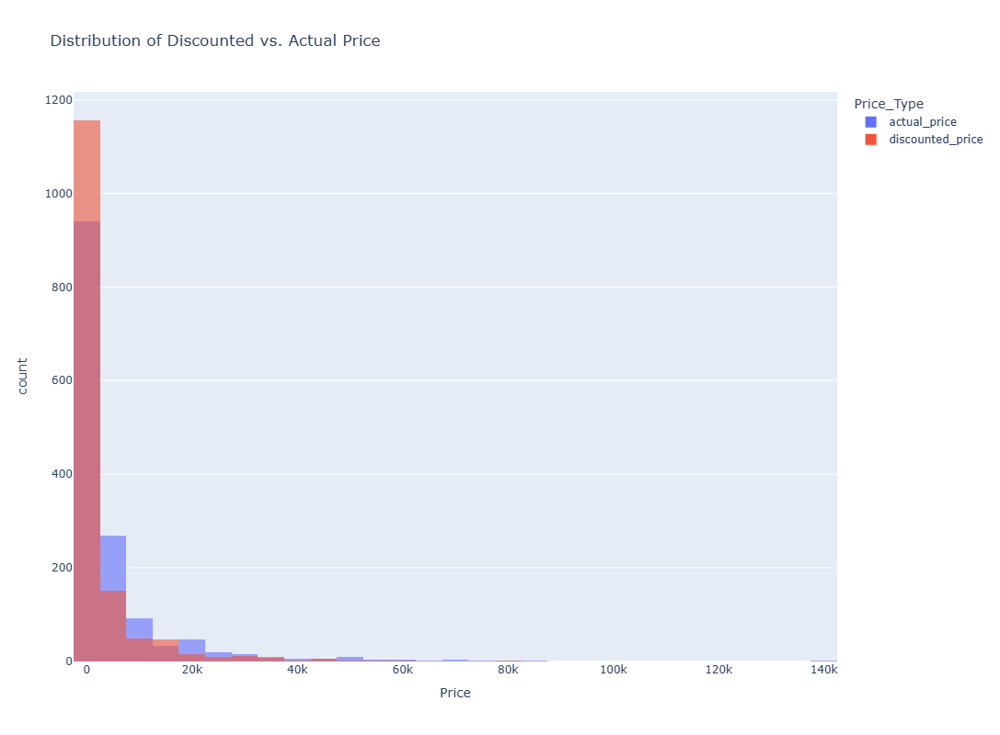

In [13]:
amazon_data = pd.read_csv("amazon.csv")
#amazon_data.info()
amazon_data["actual_price"].unique()
amazon_data["actual_price"] = amazon_data["actual_price"].str.replace("₹", "", regex=True)
amazon_data["actual_price"] = amazon_data["actual_price"].str.replace(",", "", regex=True)
amazon_data["actual_price"] = amazon_data["actual_price"].astype(float)
#amazon_data.info()
amazon_data["discounted_price"] = amazon_data["discounted_price"].replace({"₹":"", ",":""}, regex=True)
amazon_data["discounted_price"] = amazon_data["discounted_price"].astype(float)
#amazon_data.info()
amazon_data["discount_percentage"] = amazon_data["discount_percentage"].str.replace("%", "", regex=True).astype(int)
#amazon_data.info()
amazon_data["rating"] = pd.to_numeric(amazon_data["rating"], errors='coerce').astype(float)
#amazon_data.info()
amazon_data["rating_count"] = amazon_data["rating_count"].replace(",", "", regex=True)
amazon_data["rating_count"] = pd.to_numeric(amazon_data["rating_count"], errors='coerce').fillna(0).astype(int)
#amazon_data.info()
amazon_data["category"] = amazon_data["category"].astype("category")
#amazon_data.info()
amazon_data["user_name"].unique()
miss_value_row = amazon_data[amazon_data.isna().any(axis=1)]
indx_mis_value = amazon_data[amazon_data.isna().any(axis=1)].index.tolist
amazon_data.dropna()
amazon_data[["product_name", "about_product", "user_id", "user_name", "review_title", "review_content", "img_link", "product_link"]] = amazon_data[["product_name", "about_product", "user_id", "user_name", "review_title", "review_content", "img_link", "product_link"]].apply(lambda x: x.astype("string"))
#amazon_data.info()

'''Q.1]  What is the average rating for each product category?'''
avg_Rating = amazon_data["rating"].mean()
print("\nAverage rating for each product is",avg_Rating)

'''Q.2] What are the top rating_count products by category?'''
threshold = amazon_data["rating_count"].nlargest(5).min()

top_rating_count = amazon_data[amazon_data["rating_count"]>=threshold]

#print("Top rating count products are",top_rating_count)

top_rating_count = sorted(amazon_data["rating_count"].unique(), reverse=True)[:5]
top_products = amazon_data[amazon_data["rating_count"].isin(top_rating_count)]
print("\n",top_products)

'''Q.3] What is the distribution of discounted prices vs. actual prices?'''
price_Data = amazon_data[["actual_price", "discounted_price"]].melt(var_name="Price_Type", value_name="Price")

fig = px.histogram(price_Data, x="Price", color="Price_Type", nbins=30, barmode='overlay', opacity=0.6, title="Distribution of Discounted vs. Actual Price")
fig.update_layout(height=800)
fig.show()

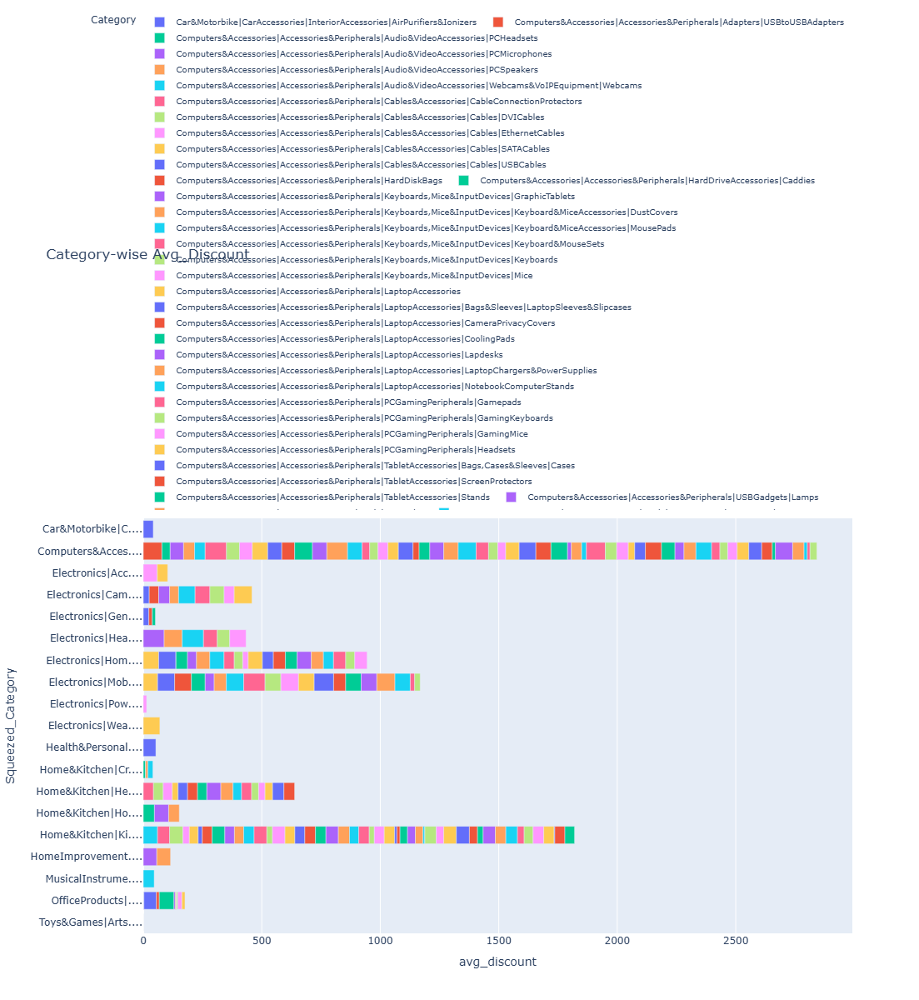

In [30]:
'''Q.4] How does the average discount percentage vary across categories?'''
avg_discount = amazon_data.groupby("category")["discount_percentage"].mean().reset_index()
avg_discount.columns = ["Category", "avg_discount"]
#print(avg_discount)
avg_discount["Squeezed_Category"] = avg_discount["Category"].apply(lambda x: x if len(x)<=15 else x[:15]+"....")
fig2 = px.bar(avg_discount, y="Squeezed_Category", x="avg_discount", orientation = 'h', title="Category-wise Avg_Discount", color="Category", height=1200, width=1000)
fig2.update_layout(yaxis=dict(autorange="reversed"))
fig2.update_layout(legend=dict(orientation='h', yanchor="bottom", y=1.02, xanchor="right", x=1, font=dict(size=10)))

fig2.show()


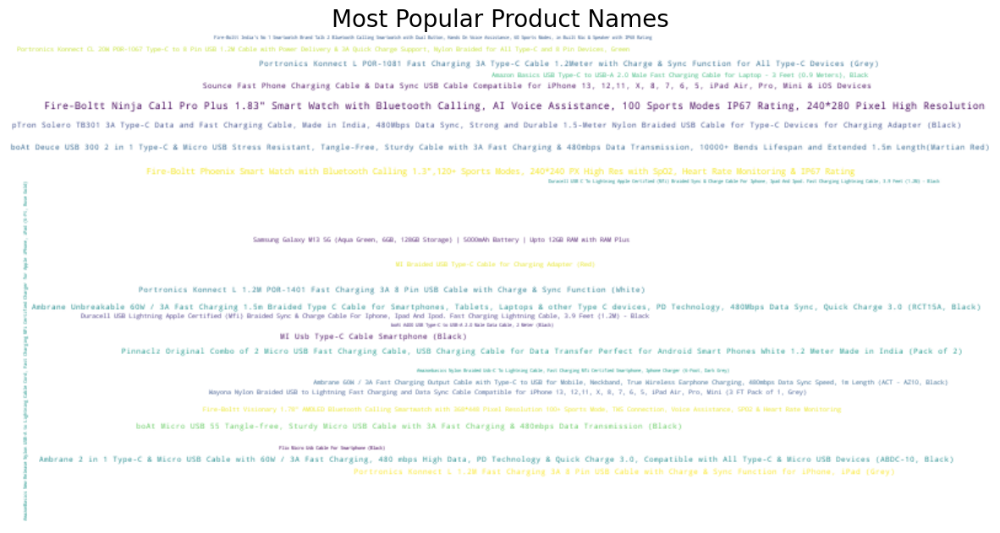

In [34]:
'''Q.5]  What are the most popular product names?'''
freq_dict = amazon_data['product_name'].value_counts().to_dict()

# Generate the wordcloud from the frequency dictionary
wc = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dict)

# Display the wordcloud
plt.figure(figsize=(15, 8))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Most Popular Product Names", fontsize=20)
plt.show()

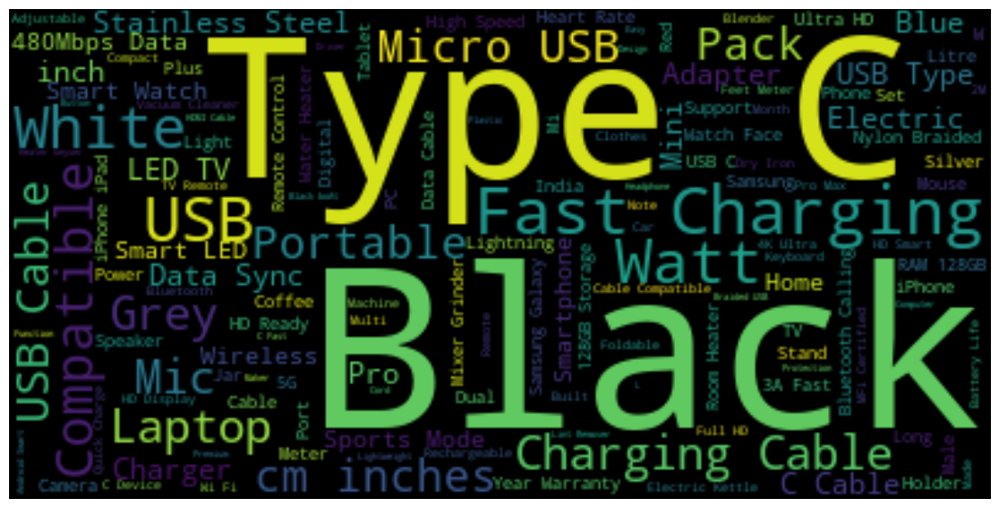

In [37]:
'''Q.6] What are the most popular product keywords?'''
word_string = ''
stopwords = set(STOPWORDS)
for keyword in amazon_data.product_name.values:
    word_string = word_string + keyword
wordcloud = WordCloud(background_color='black',stopwords=stopwords).generate(word_string)

fig = plt.figure()
fig.set_figwidth(14)
fig.set_figheight(18)

#Plotting the wordcloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
'''Q.7] What are the most popular product reviews?'''
